# Dreambooth with Multiple Classes

In [1]:
#! pip install git+https://github.com/ShivamShrirao/diffusers.git
! pip install -U --pre triton 
! pip install -r requirements.txt

     |████████████████████████████████| 18.7 MB 5.6 MB/s eta 0:00:01
     |████████████████████████████████| 23.3 MB 69.5 MB/s eta 0:00:01
     |████████████████████████████████| 143 kB 6.6 MB/s eta 0:00:01
     |████████████████████████████████| 5.5 MB 56.0 MB/s eta 0:00:01
     |████████████████████████████████| 53 kB 3.3 MB/s  eta 0:00:01
     |████████████████████████████████| 6.0 MB 64.0 MB/s eta 0:00:01
     |████████████████████████████████| 7.6 MB 66.9 MB/s eta 0:00:01
     |████████████████████████████████| 163 kB 84.5 MB/s eta 0:00:01
     |████████████████████████████████| 757 kB 76.7 MB/s eta 0:00:01
     |████████████████████████████████| 781 kB 60.8 MB/s eta 0:00:01
     |████████████████████████████████| 124 kB 70.5 MB/s eta 0:00:01
     |████████████████████████████████| 175 kB 65.0 MB/s eta 0:00:01
     |████████████████████████████████| 4.7 MB 50.3 MB/s eta 0:00:01
     |████████████████████████████████| 232 kB 62.2 MB/s eta 0:00:01
     |█████████████████████████████

In [13]:
# !git clone https://github.com/TimDettmers/bitsandbytes.git

Cloning into 'bitsandbytes'...
remote: Enumerating objects: 3759, done.
remote: Counting objects: 100% (522/522), done.
remote: Compressing objects: 100% (182/182), done.
remote: Total 3759 (delta 394), reused 416 (delta 340), pack-reused 3237
Receiving objects: 100% (3759/3759), 840.69 KiB | 38.21 MiB/s, done.
Resolving deltas: 100% (2609/2609), done.


In [16]:
# !cd bitsandbytes && make cuda11x

Makefile:10: WARNING: CUDA_VERSION not set. Call make with CUDA string, for example: make cuda11x CUDA_VERSION=115 or make cpuonly CUDA_VERSION=CPU
mkdir -p build
mkdir -p dependencies
ENVIRONMENT
CUDA_VERSION: 
NVCC path: /usr/bin/nvcc
GPP path: /usr/bin/g++ VERSION: g++ (Ubuntu 9.4.0-1ubuntu1~20.04.1) 9.4.0
CUDA_HOME: /usr
CONDA_PREFIX: 
PATH: /home/ubuntu/.local/bin:/home/ubuntu/.local/bin:/usr/local/sbin:/usr/local/bin:/usr/sbin:/usr/bin:/sbin:/bin:/usr/games:/usr/local/games:/snap/bin
LD_LIBRARY_PATH: 
/usr/bin/nvcc -gencode arch=compute_75,code=sm_75 -gencode arch=compute_80,code=sm_80 -gencode arch=compute_86,code=sm_86 -Xcompiler '-fPIC' --use_fast_math -Xptxas=-v -dc /home/ubuntu/diffusers/examples/dreambooth/bitsandbytes/csrc/ops.cu /home/ubuntu/diffusers/examples/dreambooth/bitsandbytes/csrc/kernels.cu -I /usr/include -I /home/ubuntu/diffusers/examples/dreambooth/bitsandbytes/csrc -I /include -I /home/ubuntu/diffusers/examples/dreambooth/bitsandbytes/dependencies/cub -I /hom

In [1]:
!pip install huggingface_hub

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [3]:
#@markdown Check type of GPU and VRAM available.
!nvidia-smi --query-gpu=name,memory.total,memory.free --format=csv,noheader

NVIDIA RTX A4500, 20470 MiB, 20185 MiB


https://github.com/ShivamShrirao/diffusers/tree/main/examples/dreambooth

## Install Requirements

In [10]:
!wget -q https://github.com/ShivamShrirao/diffusers/raw/main/scripts/convert_diffusers_to_original_stable_diffusion.py

In [4]:
# !wget -q https://github.com/ShivamShrirao/diffusers/raw/main/examples/dreambooth/train_dreambooth.py
# !wget -q https://github.com/ShivamShrirao/diffusers/raw/main/scripts/convert_diffusers_to_original_stable_diffusion.py
# %pip install -qq git+https://github.com/ShivamShrirao/diffusers
%pip install -q -U --pre triton
%pip install -q accelerate==0.12.0 transformers ftfy bitsandbytes gradio natsort

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
#@title Login to HuggingFace 🤗

#@markdown You need to accept the model license before downloading or using the Stable Diffusion weights. Please, visit the [model card](https://huggingface.co/runwayml/stable-diffusion-v1-5), read the license and tick the checkbox if you agree. You have to be a registered user in 🤗 Hugging Face Hub, and you'll also need to use an access token for the code to work.
# https://huggingface.co/settings/tokens
!mkdir -p ~/.huggingface
HUGGINGFACE_TOKEN = "" #@param {type:"string"}
!echo -n "{HUGGINGFACE_TOKEN}" > ~/.huggingface/token

### Install xformers from precompiled wheel.

In [5]:
#%pip install -q https://github.com/metrolobo/xformers_wheels/releases/download/1d31a3ac_various_6/xformers-0.0.14.dev0-cp37-cp37m-linux_x86_64.whl
# These were compiled on Tesla T4, should also work on P100, thanks to https://github.com/metrolobo

# If precompiled wheels don't work, install it with the following command. It will take around 40 minutes to compile.
%pip install git+https://github.com/facebookresearch/xformers@1d31a3a#egg=xformers

  Cloning https://github.com/facebookresearch/xformers (to revision 1d31a3a) to /tmp/pip-install-hxtml8h8/xformers_e16a51a6764846ce9fb388d205feb2ae
  Running command git clone -q https://github.com/facebookresearch/xformers /tmp/pip-install-hxtml8h8/xformers_e16a51a6764846ce9fb388d205feb2ae
  Running command git checkout -q 1d31a3a
  Resolved https://github.com/facebookresearch/xformers to commit 1d31a3a
  Running command git submodule update --init --recursive -q
  Created wheel for xformers: filename=xformers-0.0.14.dev0-cp37-cp37m-linux_x86_64.whl size=4861922 sha256=680e341d9a4ffed6a8cc164a45476fdf5486a6d3a3b786523f78aa18a672931c
  Stored in directory: /tmp/pip-ephem-wheel-cache-7vginw5_/wheels/7d/7f/90/34aff8ff0bf6f48dbf6395a53b96ede5538939c288e482489f
Successfully built xformers
Note: you may need to restart the kernel to use updated packages.


## Settings and run

In [3]:
#@markdown If model weights should be saved directly in google drive (takes around 4-5 GB).
save_to_gdrive = False #@param {type:"boolean"}
if save_to_gdrive:
    from google.colab import drive
    drive.mount('/content/drive')

#@markdown Name/Path of the initial model.
MODEL_NAME = "runwayml/stable-diffusion-v1-5" #@param {type:"string"}

#@markdown Enter the directory name to save model at.

OUTPUT_DIR = "stable_diffusion_weights/zwx" #@param {type:"string"}
if save_to_gdrive:
    OUTPUT_DIR = "/content/drive/MyDrive/" + OUTPUT_DIR
else:
    OUTPUT_DIR = "/content/" + OUTPUT_DIR

print(f"[*] Weights will be saved at {OUTPUT_DIR}")

!mkdir -p $OUTPUT_DIR

[*] Weights will be saved at /content/stable_diffusion_weights/zwx
mkdir: cannot create directory ‘/content’: Permission denied


# Start Training

Use the table below to choose the best flags based on your memory and speed requirements. Tested on Tesla T4 GPU.


| `fp16` | `train_batch_size` | `gradient_accumulation_steps` | `gradient_checkpointing` | `use_8bit_adam` | GB VRAM usage | Speed (it/s) |
| ---- | ------------------ | ----------------------------- | ----------------------- | --------------- | ---------- | ------------ |
| fp16 | 1                  | 1                             | TRUE                    | TRUE            | 9.92       | 0.93         |
| no   | 1                  | 1                             | TRUE                    | TRUE            | 10.08      | 0.42         |
| fp16 | 2                  | 1                             | TRUE                    | TRUE            | 10.4       | 0.66         |
| fp16 | 1                  | 1                             | FALSE                   | TRUE            | 11.17      | 1.14         |
| no   | 1                  | 1                             | FALSE                   | TRUE            | 11.17      | 0.49         |
| fp16 | 1                  | 2                             | TRUE                    | TRUE            | 11.56      | 1            |
| fp16 | 2                  | 1                             | FALSE                   | TRUE            | 13.67      | 0.82         |
| fp16 | 1                  | 2                             | FALSE                   | TRUE            | 13.7       | 0.83          |
| fp16 | 1                  | 1                             | TRUE                    | FALSE           | 15.79      | 0.77         |


Add `--gradient_checkpointing` flag for around 9.92 GB VRAM usage.

remove `--use_8bit_adam` flag for full precision. Requires 15.79 GB with `--gradient_checkpointing` else 17.8 GB.

remove `--train_text_encoder` flag to reduce memory usage further, degrades output quality.

In [ ]:
# # You can also add multiple concepts here. Try tweaking `--max_train_steps` accordingly.

# concepts_list = [
#     {
#         "instance_prompt":      "photo of zwx dog",
#         "class_prompt":         "photo of a dog",
#         "instance_data_dir":    "/content/data/zwx",
#         "class_data_dir":       "/content/data/dog"
#     },
# #     {
# #         "instance_prompt":      "photo of ukj person",
# #         "class_prompt":         "photo of a person",
# #         "instance_data_dir":    "/content/data/ukj",
# #         "class_data_dir":       "/content/data/person"
# #     }
# ]

# # `class_data_dir` contains regularization images
# import json
# import os
# for c in concepts_list:
#     os.makedirs(c["instance_data_dir"], exist_ok=True)

# with open("concepts_list.json", "w") as f:
#     json.dump(concepts_list, f, indent=4)

In [ ]:
#@markdown Upload your images by running this cell.

#@markdown OR

#@markdown You can use the file manager on the left panel to upload (drag and drop) to each `instance_data_dir` (it uploads faster)

import os
from google.colab import files
import shutil

for c in concepts_list:
    print(f"Uploading instance images for `{c['instance_prompt']}`")
    uploaded = files.upload()
    for filename in uploaded.keys():
        dst_path = os.path.join(c['instance_data_dir'], filename)
        shutil.move(filename, dst_path)

In [4]:
# Hugging Face Login
from huggingface_hub import notebook_login

notebook_login()

In [6]:
! pip install functorch==0.2.1 ninja bitsandbytes

     |████████████████████████████████| 20.6 MB 5.4 MB/s eta 0:00:01
     |████████████████████████████████| 145 kB 77.1 MB/s eta 0:00:01
     |████████████████████████████    | 678.7 MB 78.2 MB/s eta 0:00:02    |█                               | 22.7 MB 26.8 MB/s eta 0:00:29     |████                            | 96.6 MB 79.5 MB/s eta 0:00:09     |██████████████▏                 | 344.9 MB 80.0 MB/s eta 0:00:06     |█████████████████████████       | 607.0 MB 73.0 MB/s eta 0:00:03

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



     |████████████████████████████████| 776.3 MB 18 kB/s s eta 0:00:01
  Attempting uninstall: torch
    Found existing installation: torch 1.12.0
    Uninstalling torch-1.12.0:
      Successfully uninstalled torch-1.12.0


In [3]:
  #--use_8bit_adam \
    
! accelerate launch train_dreambooth.py \
  --pretrained_model_name_or_path="runwayml/stable-diffusion-v1-5" \
  --pretrained_vae_name_or_path="stabilityai/sd-vae-ft-mse" \
  --output_dir="../../outputs/iconresults" \
  --revision="fp16" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=3434554 \
  --resolution=512 \
  --train_batch_size=1 \
  --mixed_precision="fp16" \
  --gradient_accumulation_steps=1 \
  --learning_rate=5e-7 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --num_class_images=1497 \
  --sample_batch_size=4 \
  --max_train_steps=40000 \
  --save_interval=250 \
  --save_sample_prompt="black and white hyena icon" \
  --concepts_list="../../res/concepts_list.json" \
  --not_cache_latents


The following values were not passed to `accelerate launch` and had defaults used instead:
	`--num_processes` was set to a value of `1`
	`--num_machines` was set to a value of `1`
	`--mixed_precision` was set to a value of `'no'`
	`--num_cpu_threads_per_process` was set to `30` to improve out-of-box performance
To avoid this warning pass in values for each of the problematic parameters or run `accelerate config`.
[!] Not using xformers memory efficient attention.
--------------------------------------------------------------------------
detected:

  Local host:            150-136-46-31
  Device name:           mlx5_0
  Device vendor ID:      0x02c9
  Device vendor part ID: 4126

Default device parameters will be used, which may result in lower
performance.  You can edit any of the files specified by the
btl_openib_device_param_files MCA parameter to set values for your
device.

NOTE: You can turn off this warning by setting the MCA parameter
      btl_openib_warn_no_device_params_found

In [ ]:
!accelerate launch train_dreambooth.py \
  --pretrained_model_name_or_path=$MODEL_NAME \
  --pretrained_vae_name_or_path="stabilityai/sd-vae-ft-mse" \
  --output_dir=$OUTPUT_DIR \
  --revision="fp16" \
  --with_prior_preservation --prior_loss_weight=1.0 \
  --seed=1337 \
  --resolution=512 \
  --train_batch_size=1 \
  --train_text_encoder \
  --mixed_precision="fp16" \
  --use_8bit_adam \
  --gradient_accumulation_steps=1 \
  --learning_rate=1e-6 \
  --lr_scheduler="constant" \
  --lr_warmup_steps=0 \
  --num_class_images=50 \
  --sample_batch_size=4 \
  --max_train_steps=800 \
  --save_interval=10000 \
  --save_sample_prompt="photo of zwx dog" \
  --concepts_list="concepts_list.json"

# Reduce the `--save_interval` to lower than `--max_train_steps` to save weights from intermediate steps.
# `--save_sample_prompt` can be same as `--instance_prompt` to generate intermediate samples (saved along with weights in samples directory).

In [6]:
#@markdown Specify the weights directory to use (leave blank for latest)
OUTPUT_DIR = '../../outputs/iconresults'
WEIGHTS_DIR = "../../outputs/iconresults" #@param {type:"string"}
if WEIGHTS_DIR == "":
    from natsort import natsorted
    from glob import glob
    import os
    WEIGHTS_DIR = natsorted(glob(OUTPUT_DIR + os.sep + "*"))[-1]
print(f"[*] WEIGHTS_DIR={WEIGHTS_DIR}")

[*] WEIGHTS_DIR=../../outputs/iconresults


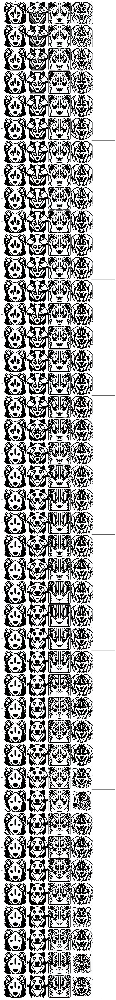

In [8]:
#@markdown Run to generate a grid of preview images from the last saved weights.
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

weights_folder = OUTPUT_DIR
folders = sorted([f for f in os.listdir(weights_folder) if f != "0" and '.ipynb' not in f], key=lambda x: int(x))

row = len(folders)
col = len(os.listdir(os.path.join(weights_folder, folders[0], "samples")))
scale = 4
fig, axes = plt.subplots(row, col, figsize=(col*scale, row*scale), gridspec_kw={'hspace': 0, 'wspace': 0})

for i, folder in enumerate(folders):
    folder_path = os.path.join(weights_folder, folder)
    image_folder = os.path.join(folder_path, "samples")
    images = [f for f in os.listdir(image_folder) if '.ipynb' not in f]
    for j, image in enumerate(images):
        if row == 1:
            currAxes = axes[j]
        else:
            currAxes = axes[i, j]
        if i == 0:
            currAxes.set_title(f"Image {j}")
        if j == 0:
            currAxes.text(-0.1, 0.5, folder, rotation=0, va='center', ha='center', transform=currAxes.transAxes)
        image_path = os.path.join(image_folder, image)
        img = mpimg.imread(image_path)
        currAxes.imshow(img, cmap='gray')
        currAxes.axis('off')
        
plt.tight_layout()
plt.savefig('grid.png', dpi=72)

## Convert weights to ckpt to use in web UIs like AUTOMATIC1111.

In [11]:
#@markdown Run conversion.
ckpt_path = WEIGHTS_DIR + "/model.ckpt"

half_arg = ""
#@markdown  Whether to convert to fp16, takes half the space (2GB).
fp16 = True #@param {type: "boolean"}
if fp16:
    half_arg = "--half"
!python convert_diffusers_to_original_stable_diffusion.py --model_path $WEIGHTS_DIR  --checkpoint_path $ckpt_path $half_arg
print(f"[*] Converted ckpt saved at {ckpt_path}")

Reshaping encoder.mid.attn_1.q.weight for SD format
Reshaping encoder.mid.attn_1.k.weight for SD format
Reshaping encoder.mid.attn_1.v.weight for SD format
Reshaping encoder.mid.attn_1.proj_out.weight for SD format
Reshaping decoder.mid.attn_1.q.weight for SD format
Reshaping decoder.mid.attn_1.k.weight for SD format
Reshaping decoder.mid.attn_1.v.weight for SD format
Reshaping decoder.mid.attn_1.proj_out.weight for SD format
[*] Converted ckpt saved at ../../outputs/iconresults/9500/model.ckpt


## Inference

In [7]:
import torch
from torch import autocast
from diffusers import StableDiffusionPipeline, DDIMScheduler
from IPython.display import display

model_path = WEIGHTS_DIR             # If you want to use previously trained model saved in gdrive, replace this with the full path of model in gdrive

scheduler = DDIMScheduler(beta_start=0.00085, beta_end=0.012, beta_schedule="scaled_linear", clip_sample=False, set_alpha_to_one=False)
pipe = StableDiffusionPipeline.from_pretrained(model_path, scheduler=scheduler, safety_checker=None, torch_dtype=torch.float16).to("cuda")

g_cuda = None

In [8]:
#@markdown Can set random seed here for reproducibility.
g_cuda = torch.Generator(device='cuda')
seed = 52362 #@param {type:"number"}
g_cuda.manual_seed(seed)

  0%|          | 0/250 [00:00<?, ?it/s]

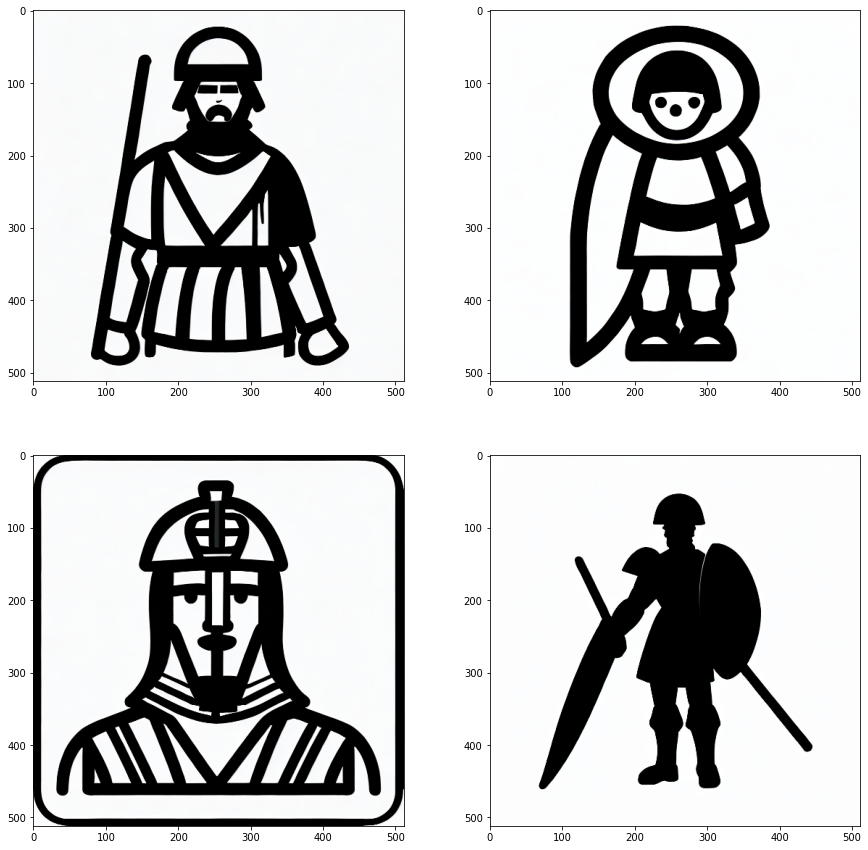

In [11]:
#@title Run for generating images.
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np


prompt = "black and white roman soldier icon" #@param {type:"string"}
negative_prompt = "" #@param {type:"string"}
num_samples = 4 #@param {type:"number"}
guidance_scale = 25 #@param {type:"number"}
num_inference_steps = 250 #@param {type:"number"}
height = 512 #@param {type:"number"}
width = 512 #@param {type:"number"}

with autocast("cuda"), torch.inference_mode():
    images = pipe(
        prompt,
        height=height,
        width=width,
        negative_prompt=negative_prompt,
        num_images_per_prompt=num_samples,
        num_inference_steps=num_inference_steps,
        guidance_scale=guidance_scale,
        generator=g_cuda
    ).images

    
rows=2
cols = 2
img_count = 0

fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15,15))

for i in range(rows):
    for j in range(cols):        
        if img_count < len(images):
            axes[i, j].imshow(images[img_count])
            img_count+=1
plt.show()

# for img in images:
#     display(img)

In [11]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np

#@title Run for generating images.
def plot_samples_3x3(prompt,
                     negative_prompt = "", #@param {type:"string"}
                        num_samples = 9, #@param {type:"number"}
                        guidance_scale = 25, #@param {type:"number"}
                        num_inference_steps = 500, #@param {type:"number"}
                        height = 512, #@param {type:"number"}
                        width = 512, #@param {type:"number"}):
                        #prompt = "black and white roman soldier icon" #@param {type:"string"}
                    ):    

    with autocast("cuda"), torch.inference_mode():
        images = pipe(
            prompt,
            height=height,
            width=width,
            negative_prompt=negative_prompt,
            num_images_per_prompt=num_samples,
            num_inference_steps=num_inference_steps,
            guidance_scale=guidance_scale,
            generator=g_cuda
        ).images


    rows=3
    cols = 3
    img_count = 0

    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15,15))

    for i in range(rows):
        for j in range(cols):        
            if img_count < len(images):
                axes[i, j].imshow(images[img_count])
                img_count+=1
    
    plt.show()

    # for img in images:
    #     display(img)

  0%|          | 0/250 [00:00<?, ?it/s]

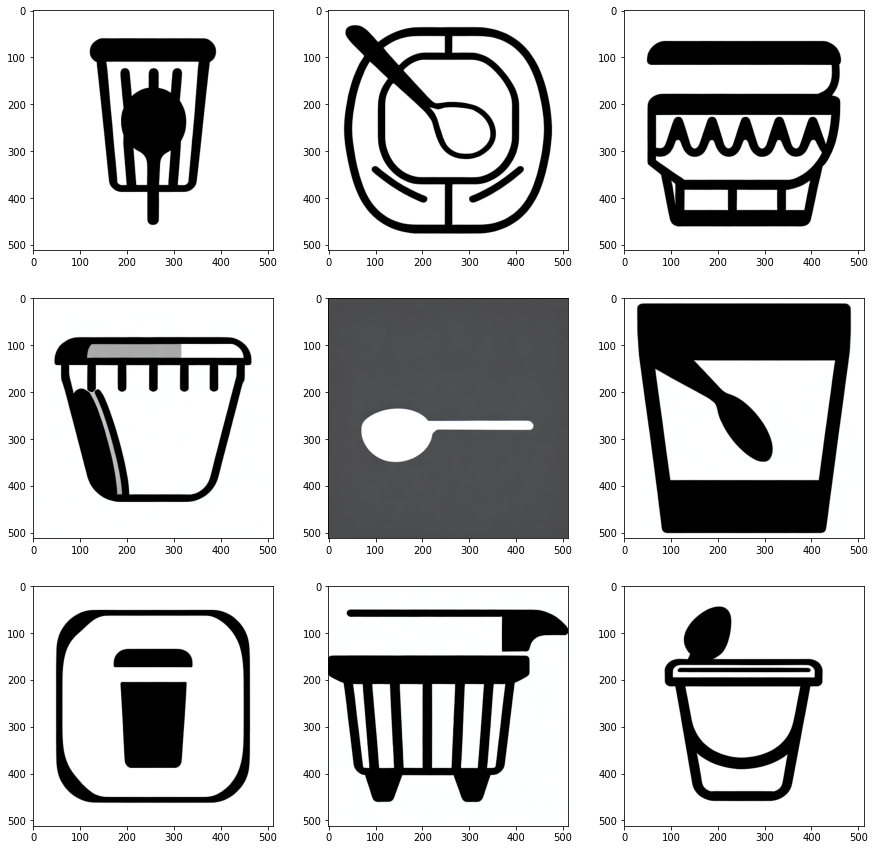

In [12]:
plot_samples_3x3('a black and white yogurt container with spoon icon',
                 guidance_scale=25, num_inference_steps=250)

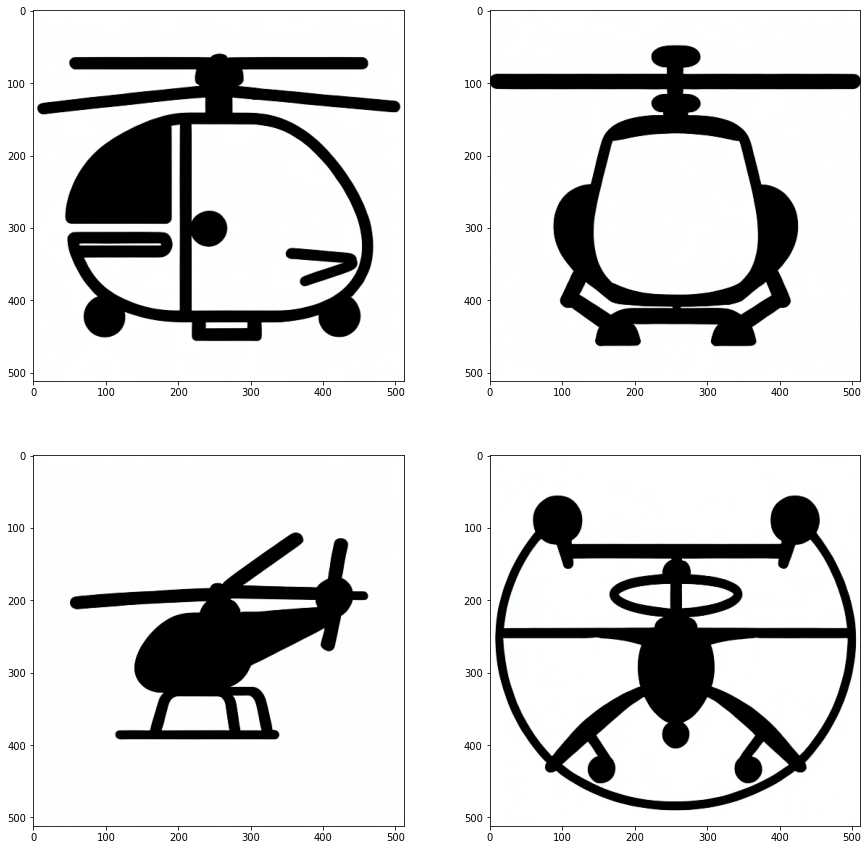

In [8]:
rows=2
cols = 2
img_count = 0

fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(15,15))

for i in range(rows):
    for j in range(cols):        
        if img_count < len(images):
            axes[i, j].imshow(images[img_count])
            img_count+=1

# Generate a ton of images

In [ ]:
# from a list of requested icons: https://icons8.com/icons/request-icon
prompts = ['hyena', 'fox', 'playstation', 'trash', 'laundry', 
           'soup', 'yogurt container', 'fennel', 'keyboard',
           'instagram icon', 'the sims icon', 'galaxy app store',
           'amazon app store', 'world of tanks',
           'python', 'steam store', 'phone', 'discord logo',
           'twitter logo', 'jupyter notebook',
           'crocodile holding a computer',
           'jesus christ crucifix', 'pet family', 'lily flower',
           'rose flower', 'elon musk',
           'peace sign symbol', 'flexing muscle', 'flexing arm muscle',
           'fisherman boat',
           'a paintbrush', 'skiing']

for prompt in prompts:
    plot_samples_3x3('a black and white {} icon'.format(prompt),
                     guidance_scale=25, num_inference_steps=250)

  0%|          | 0/250 [00:00<?, ?it/s]

In [28]:
!pip install --upgrade fsspec 

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [29]:
! pip install --upgrade gradio

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python3 -m pip install --upgrade pip


In [ ]:
#@markdown Run Gradio UI for generating images.
import gradio as gr

def inference(prompt, negative_prompt, num_samples, height=512, width=512, num_inference_steps=50, guidance_scale=7.5):
    with torch.autocast("cuda"), torch.inference_mode():
        return pipe(
                prompt, height=int(height), width=int(width),
                negative_prompt=negative_prompt,
                num_images_per_prompt=int(num_samples),
                num_inference_steps=int(num_inference_steps), guidance_scale=guidance_scale,
                generator=g_cuda
            ).images

with gr.Blocks() as demo:
    with gr.Row():
        with gr.Column():
            prompt = gr.Textbox(label="Prompt", value="black and white helicopter icon")
            negative_prompt = gr.Textbox(label="Negative Prompt", value="")
            run = gr.Button(value="Generate")
            with gr.Row():
                num_samples = gr.Number(label="Number of Samples", value=4)
                guidance_scale = gr.Number(label="Guidance Scale", value=7.5)
            with gr.Row():
                height = gr.Number(label="Height", value=512)
                width = gr.Number(label="Width", value=512)
            num_inference_steps = gr.Slider(label="Steps", value=50)
        with gr.Column():
            gallery = gr.Gallery()

    run.click(inference, inputs=[prompt, negative_prompt, num_samples, height, width, num_inference_steps, guidance_scale], outputs=gallery)

demo.launch(debug=True)

/home/ubuntu/.local/lib/python3.8/site-packages/pandas/core/computation/expressions.py:20: UserWarning: Pandas requires version '2.7.3' or newer of 'numexpr' (version '2.7.1' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED


Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.


In [ ]:
#@title (Optional) Delete diffuser and old weights and only keep the ckpt to free up drive space.

#@markdown [ ! ] Caution, Only execute if you are sure u want to delete the diffuser format weights and only use the ckpt.
import shutil
from glob import glob
import os
for f in glob(OUTPUT_DIR+os.sep+"*"):
    if f != WEIGHTS_DIR:
        shutil.rmtree(f)
        print("Deleted", f)
for f in glob(WEIGHTS_DIR+"/*"):
    if not f.endswith(".ckpt") or not f.endswith(".json"):
        try:
            shutil.rmtree(f)
        except NotADirectoryError:
            continue
        print("Deleted", f)

In [ ]:
#@title Free runtime memory
exit()